In [1]:
import os
import pathlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# import PIL

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau,ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.backend import epsilon
from tensorflow.keras.applications.mobilenet import MobileNet
import splitfolders
import glob
import cv2
import tqdm

2023-08-12 10:31:12.161921: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-12 10:31:12.659481: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-08-12 10:31:14.380894: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/root/anaconda3/envs/tf/lib/:/root/anaconda3/envs/tf/lib/
2023-08-12 10:31:14.384248: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dler

### Defining the path for test and train data

In [2]:
input_folder = '../input/'
output_folder = '../dataset/'
data_dir_train = '../dataset/train'
data_dir_test = '../dataset/test'

In [3]:
guide=pd.read_csv(os.path.join(input_folder,'train_labels_.csv'))
guide

,filename,width,height,class,xmin,ymin,xmax,ymax
0,raccoon-17.jpg,259,194,raccoon,95,60,167,118
1,raccoon-11.jpg,660,432,raccoon,3,1,461,431
2,raccoon-63.jpg,600,400,raccoon,74,107,280,290
3,raccoon-63.jpg,600,400,raccoon,227,93,403,298
4,raccoon-60.jpg,273,185,raccoon,58,33,197,127
...,...,...,...,...,...,...,...,...
168,raccoon-137.jpg,320,240,raccoon,71,8,304,233
169,raccoon-171.jpg,224,225,raccoon,108,21,180,115
170,raccoon-190.jpg,259,194,raccoon,78,54,153,135
171,raccoon-22.jpg,640,360,raccoon,252,76,466,335


In [4]:
trainpath = os.path.join(input_folder,'raccoon') 
new_size=128
X_train = []
y_train = []
for img in tqdm.tqdm(guide['filename'].values[:161]): 
    full_path = os.path.join(trainpath,img)  
    orignal_image = cv2.imread(full_path)
    image = cv2.cvtColor(orignal_image, cv2.COLOR_BGR2RGB)
    resized_image = cv2.resize(image , (new_size, new_size))
    X_train.append(resized_image)
    
print('Image reading... finished')
print('--------------------------------------------------')

100%|██████████| 161/161 [00:04<00:00, 34.10it/s]

Image reading... finished
--------------------------------------------------


In [5]:
X_train=np.array(X_train)

In [6]:
X_train = X_train / 255.0

In [7]:
X_train.shape

(161, 128, 128, 3)

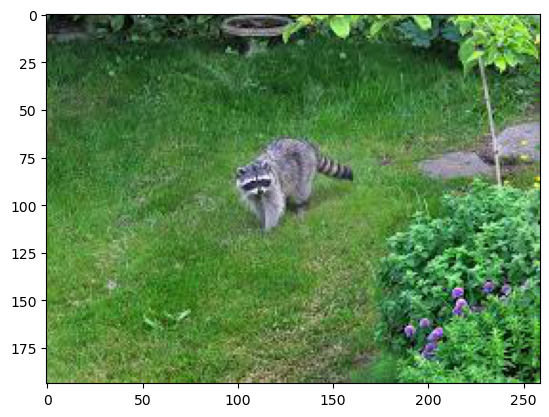

In [8]:
img=plt.imread(os.path.join(trainpath,'raccoon-17.jpg'))
plt.imshow(img)

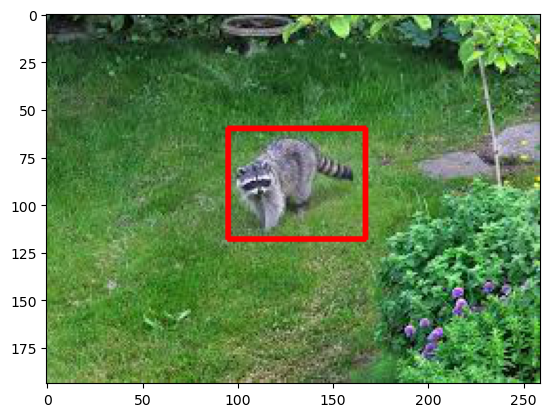

In [9]:
index = 0
img=cv2.rectangle(img,
                  (guide['xmin'][index],guide['ymin'][index]),
                  (guide['xmax'][index],guide['ymax'][index]), 
                  (255,0,0),2)
plt.imshow(img)

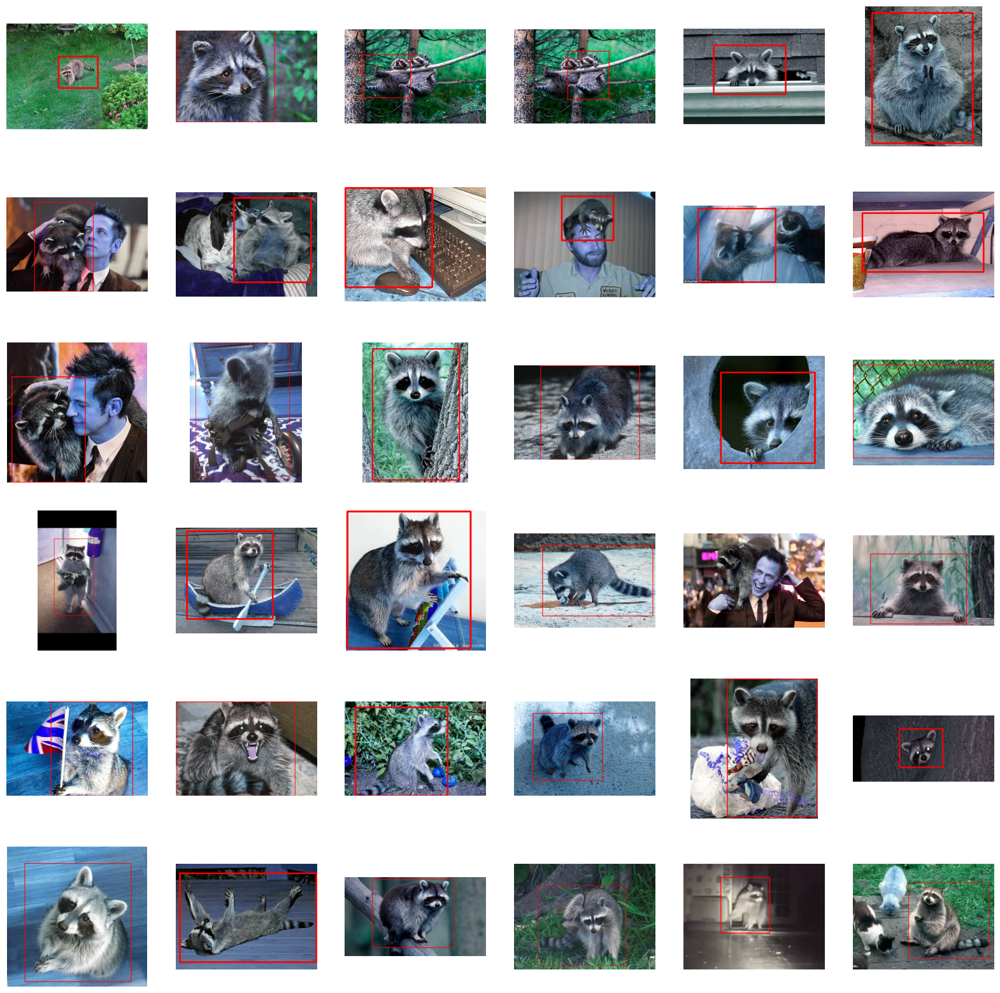

In [10]:
#showing training images with labels
plt.figure(figsize=(20,20))
for n , i in enumerate(range(36)) : 
    plt.subplot(6,6,n+1)
    img = cv2.imread(os.path.join(trainpath,str(guide.iloc[i,0])))
    img=cv2.rectangle(img,(guide['xmin'][i],guide['ymin'][i]), (guide['xmax'][i],guide['ymax'][i]) , (255,0,0),2)
    plt.imshow(img)   
    plt.axis('off')

In [11]:
#loading data and resize it and collect it in one folder
testpath = os.path.join(input_folder,'raccoon') 
X_test = []
y_test = []
for path in tqdm.tqdm(guide['filename'].values[161:]): 
    orignal_image = cv2.imread(os.path.join(testpath,path))
    image = cv2.cvtColor(orignal_image, cv2.COLOR_BGR2RGB)
    resized_image = cv2.resize(image , (new_size,new_size))
    X_test.append(resized_image)

X_test = np.array(X_test)
X_test = X_test / 255.0
print('image reading ...finished')

100%|██████████| 12/12 [00:00<00:00, 31.08it/s]

image reading ...finished


In [12]:
guide=guide[["width","height","xmin","ymin","xmax","ymax"]]
guide["xmin"] = guide["xmin"] *new_size/guide["width"]
guide["xmax"] = guide["xmax"]*new_size /guide["width"]
guide["ymin"] = guide["ymin"] *new_size/guide["height"]
guide["ymax"] = guide["ymax"] *new_size/guide["height"]

/tmp/ipykernel_669/1101924365.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guide["xmin"] = guide["xmin"] *new_size/guide["width"]
/tmp/ipykernel_669/1101924365.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guide["xmax"] = guide["xmax"]*new_size /guide["width"]
/tmp/ipykernel_669/1101924365.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

In [13]:
#guide=guide.astype('int32')
guide.drop(['width','height'],axis=1,inplace=True)
guide.head()

/tmp/ipykernel_669/998209522.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guide.drop(['width','height'],axis=1,inplace=True)


,xmin,ymin,xmax,ymax
0,46.949807,39.587629,82.532819,77.855670
1,0.581818,0.296296,89.406061,127.703704
2,15.786667,34.240000,59.733333,92.800000
3,48.426667,29.760000,85.973333,95.360000
4,27.194139,22.832432,92.366300,87.870270


In [14]:
y_train=guide.iloc[:161,:]
y_test=guide.iloc[161:,:]

### Creating Models

In [15]:
def loss(gt,pred):
    intersections = 0
    unions = 0
    diff_width = np.minimum(gt[:,0] + gt[:,2], pred[:,0] + pred[:,2]) - np.maximum(gt[:,0], pred[:,0])
    diff_height = np.minimum(gt[:,1] + gt[:,3], pred[:,1] + pred[:,3]) - np.maximum(gt[:,1], pred[:,1])
    intersection = diff_width * diff_height
    # Compute union
    area_gt = gt[:,2] * gt[:,3]
    area_pred = pred[:,2] * pred[:,3]
    union = area_gt + area_pred - intersection
#     Compute intersection and union over multiple boxes
    for j, _ in enumerate(union):
        if union[j] > 0 and intersection[j] > 0 and union[j] >= intersection[j]:
            intersections += intersection[j]
            unions += union[j]
    # Compute IOU. Use epsilon to prevent division by zero
    iou = np.round(intersections / (unions + epsilon()), 4)
    iou = iou.astype(np.float32)
    return iou

def IoU(y_true, y_pred):
    iou = tf.py_function(loss, [y_true, y_pred], tf.float32)
    return iou

In [16]:
#callbacks
EarlyStop=EarlyStopping(patience=5,monitor='val_iou',restore_best_weights=True)
Reduce_LR=ReduceLROnPlateau(monitor='val_iou',verbose=2,factor=0.5,min_lr=0.00001)
model_check=ModelCheckpoint('model.hdf5',monitor='val_iou',verbose=1,save_best_only=True)
callback=[EarlyStop , Reduce_LR,model_check]

#optimizer
optimizer_adam=Adam(learning_rate=0.001,beta_1=0.9,beta_2=0.99)

In [17]:
model=Sequential([
                    Conv2D(64,3,activation='relu',kernel_initializer='he_normal',input_shape=(new_size,new_size,3),kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
                    BatchNormalization(),
                    MaxPooling2D(3),
    
                    Conv2D(128,3,activation='relu',kernel_initializer='he_normal',kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
                    BatchNormalization(),
                    MaxPooling2D(3),
    
                    Conv2D(256,3,activation='relu',kernel_initializer='he_normal',kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
                    BatchNormalization(),
                    MaxPooling2D(3),
    
    
                    Flatten(),
                    Dense(128,activation='relu',kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
                    Dense(32,activation='relu',kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
                    Dense(4,activation='relu',kernel_initializer='glorot_normal')
                  
])


2023-08-12 10:31:28.390576: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-08-12 10:31:28.445635: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-08-12 10:31:28.445718: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-08-12 10:31:28.447333: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate

In [18]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 64)      1792      
                                                                 
 batch_normalization (BatchN  (None, 126, 126, 64)     256       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 42, 42, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 40, 40, 128)       73856     
                                                                 
 batch_normalization_1 (Batc  (None, 40, 40, 128)      512       
 hNormalization)                                                 
                                                        

In [19]:
model.compile(optimizer=optimizer_adam, loss='mse', metrics=[IoU])

history=model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=200,batch_size=4,
                  steps_per_epoch=len(X_train)//4,
                  callbacks=callback, verbose=1)

Epoch 1/200


2023-08-12 10:31:32.635116: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100
2023-08-12 10:31:33.675353: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-08-12 10:31:33.742173: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-08-12 10:31:33.742251: W tensorflow/stream_executor/gpu/asm_compiler.cc:80] Couldn't get ptxas version string: INTERNAL: Couldn't invoke ptxas --version
2023-08-12 10:31:33.823117: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-08-12 10:31:33.823294: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] INTERNAL: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.


40/40 [==============================] - 7s 60ms/step - loss: 1270.8633 - IoU: 0.3618 - val_loss: 5099.6611 - val_IoU: 0.0331 - lr: 0.0010
Epoch 2/200
40/40 [==============================] - 2s 57ms/step - loss: 551.8561 - IoU: 0.4614 - val_loss: 3921.3972 - val_IoU: 0.0384 - lr: 0.0010
Epoch 3/200
40/40 [==============================] - 2s 51ms/step - loss: 432.6476 - IoU: 0.4836 - val_loss: 2862.5349 - val_IoU: 0.1092 - lr: 0.0010
Epoch 4/200
40/40 [==============================] - 2s 54ms/step - loss: 516.7299 - IoU: 0.4660 - val_loss: 1193.3140 - val_IoU: 0.2171 - lr: 0.0010
Epoch 5/200
40/40 [==============================] - 2s 57ms/step - loss: 451.2941 - IoU: 0.4911 - val_loss: 1302.1654 - val_IoU: 0.2304 - lr: 0.0010
Epoch 6/200
40/40 [==============================] - 3s 65ms/step - loss: 394.2127 - IoU: 0.5171 - val_loss: 1677.6144 - val_IoU: 0.2102 - lr: 0.0010
Epoch 7/200
40/40 [==============================] - 2s 58ms/step - loss: 350.1149 - IoU: 0.5348 - val_loss: 10

### Visualizing the data

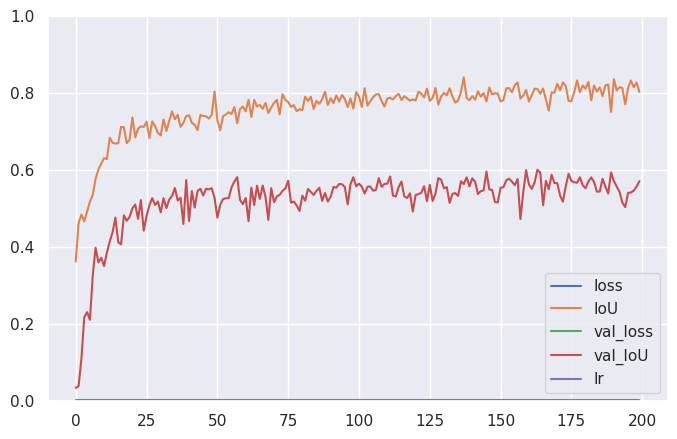

In [20]:
#plotting training values
import seaborn as sns
sns.set()


pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

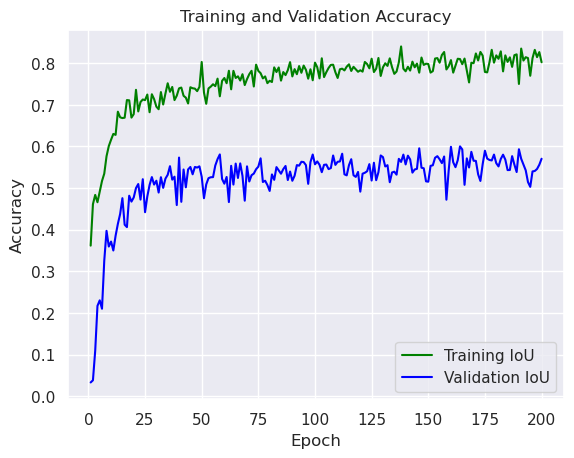

In [21]:
IoU = history.history['IoU']
val_IoU = history.history['val_IoU']
epochs = range(1, len(IoU) + 1)

#accuracy plot
plt.plot(epochs, IoU, color='green', label='Training IoU')
plt.plot(epochs, val_IoU, color='blue', label='Validation IoU')
plt.title('Training and Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

In [22]:
img=plt.imread(os.path.join(trainpath,'raccoon-2.jpg'))

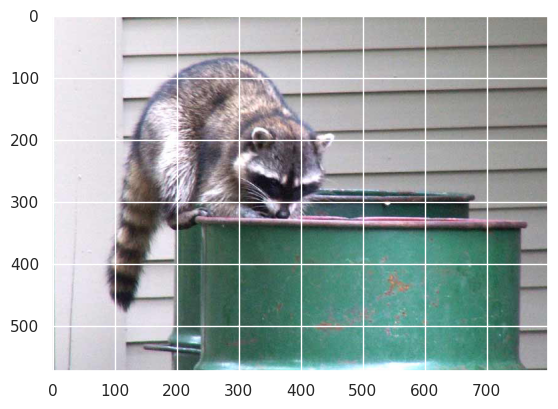

In [23]:
plt.imshow(img)

In [24]:
image_height, image_width, _ = img.shape
image = cv2.resize(img,(new_size,new_size))
image = image / 255.0

In [25]:
image.shape

(128, 128, 3)

In [26]:
image=np.expand_dims(image,axis=0)

In [27]:
region = model.predict(image)[0]
region

1/1 [==============================] - 0s 255ms/step


array([ 11.788835 ,   7.7477646,  73.86103  , 111.08309  ], dtype=float32)

In [28]:
x0 = int(region[0] * image_width / new_size) 
y0 = int(region[1] * image_height / new_size)
x1 = int((region[2]) * image_width / new_size)
y1 = int((region[3]) * image_height / new_size)

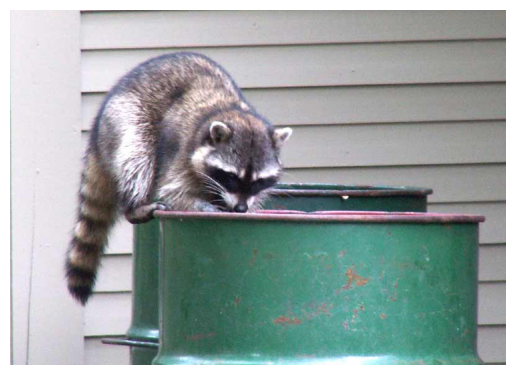

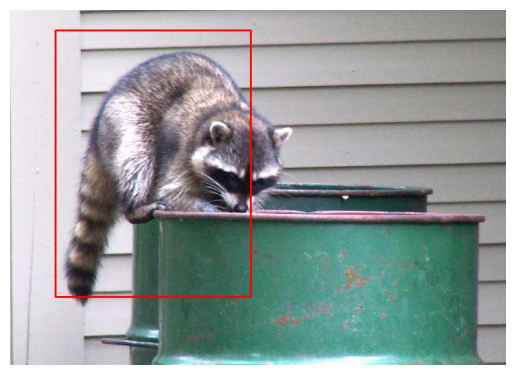

In [29]:
# Display the image
img=plt.imread(os.path.join(trainpath,'raccoon-2.jpg'))
plt.imshow(img)
plt.axis('off')
plt.show()
# Create a Rectangle patch
cv2.rectangle(img,(x0, y0), ((x1 - x0) , (y1 - y0)) , (255,0,0),2)

# Add the patch to the Axes
plt.imshow(img)
plt.axis('off')
plt.show()

1/1 [==============================] - 0s 91ms/step


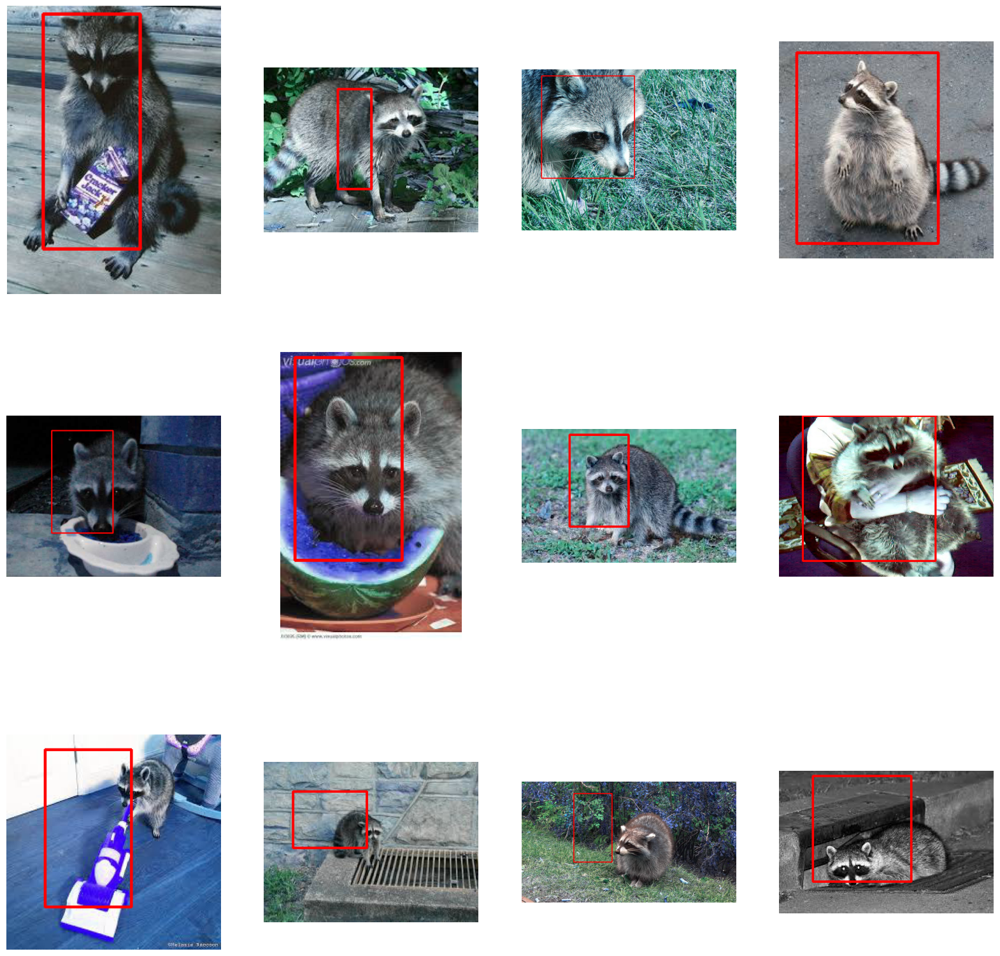

In [36]:
#showing training images with labels
df=pd.read_csv(os.path.join(input_folder, 'train_labels_.csv'))[161:]
plt.figure(figsize=(20,20))
for n , i in enumerate(range(12)) : 
    plt.subplot(3,4,n+1)
    img = cv2.imread(os.path.join(trainpath,str(df.iloc[i,0])))
    org_img=img.copy()
    image_height, image_width, _ = img.shape
    img = cv2.resize(img,(new_size,new_size))
    img = img / 255.0
    img=np.expand_dims(img,axis=0)
    region = model.predict(img)[0]
    x0 = int(region[0] * image_width / new_size) 
    y0 = int(region[1] * image_height / new_size)
    x1 = int((region[2]) * image_width / new_size)
    y1 = int((region[3]) * image_height / new_size)
    cv2.rectangle(org_img,(x0, y0), ((x1 - x0) , (y1 - y0)) , (255,0,0),2)
    plt.imshow(org_img)   
    plt.axis('off')

In [37]:
from tensorflow.keras.backend import epsilon
def loss(gt,pred):
    intersections = 0
    unions = 0
    diff_width = np.minimum(gt[:,0] + gt[:,2], pred[:,0] + pred[:,2]) - np.maximum(gt[:,0], pred[:,0])
    diff_height = np.minimum(gt[:,1] + gt[:,3], pred[:,1] + pred[:,3]) - np.maximum(gt[:,1], pred[:,1])
    intersection = diff_width * diff_height
    
    # Compute union
    area_gt = gt[:,2] * gt[:,3]
    area_pred = pred[:,2] * pred[:,3]
    union = area_gt + area_pred - intersection

#     Compute intersection and union over multiple boxes
    for j, _ in enumerate(union):
        if union[j] > 0 and intersection[j] > 0 and union[j] >= intersection[j]:
            intersections += intersection[j]
            unions += union[j]

    # Compute IOU. Use epsilon to prevent division by zero
    iou = np.round(intersections / (unions + epsilon()), 4)
    iou = iou.astype(np.float32)
    return iou

def IoU(y_true, y_pred):
    iou = tf.py_function(loss, [y_true, y_pred], tf.float32)
    return iou

In [38]:
#callbacks
EarlyStop=EarlyStopping(patience=5,monitor='val_iou',restore_best_weights=True)
Reduce_LR=ReduceLROnPlateau(monitor='val_iou',verbose=2,factor=0.5,min_lr=0.00001)
model_check=ModelCheckpoint('model.hdf5',monitor='val_iou',verbose=1,save_best_only=True)
callback=[EarlyStop , Reduce_LR,model_check]

#optimizer
optimizer_adam=Adam(learning_rate=0.001,beta_1=0.9,beta_2=0.99)

### Model 3

In [39]:
MB=MobileNet(include_top=False,input_shape=(128,128,3))
MB.trainable=True

In [40]:
model1=Sequential([MB,
                    Flatten(),
                    Dense(128,activation='relu',kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
                    Dense(32,activation='relu',kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
                    Dense(4,activation='relu',kernel_initializer='glorot_normal')
                  
])
optimizer_adam=Adam(learning_rate=0.001,beta_1=0.9,beta_2=0.99)
model1.compile(optimizer=optimizer_adam, loss='mse', metrics=[IoU])

In [41]:
history1=model1.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=200,batch_size=4,
                  steps_per_epoch=len(X_train)//4,
                  callbacks=callback, verbose=1)

Epoch 1/200
40/40 [==============================] - 70s 1s/step - loss: 2211.0115 - IoU: 0.2440 - val_loss: 10494.4463 - val_IoU: 0.0668 - lr: 0.0010
Epoch 2/200
40/40 [==============================] - 50s 1s/step - loss: 388.7981 - IoU: 0.5299 - val_loss: 1071.4288 - val_IoU: 0.3899 - lr: 0.0010
Epoch 3/200
40/40 [==============================] - 40s 1s/step - loss: 327.1458 - IoU: 0.5642 - val_loss: 1322.2891 - val_IoU: 0.3860 - lr: 0.0010
Epoch 4/200
40/40 [==============================] - 39s 971ms/step - loss: 269.5215 - IoU: 0.6040 - val_loss: 301.2083 - val_IoU: 0.6495 - lr: 0.0010
Epoch 5/200
40/40 [==============================] - 35s 884ms/step - loss: 229.3018 - IoU: 0.6136 - val_loss: 761.1594 - val_IoU: 0.4394 - lr: 0.0010
Epoch 6/200
40/40 [==============================] - 22s 547ms/step - loss: 184.9742 - IoU: 0.6465 - val_loss: 253.2953 - val_IoU: 0.6162 - lr: 0.0010
Epoch 7/200
40/40 [==============================] - 17s 420ms/step - loss: 140.5677 - IoU: 0.6983

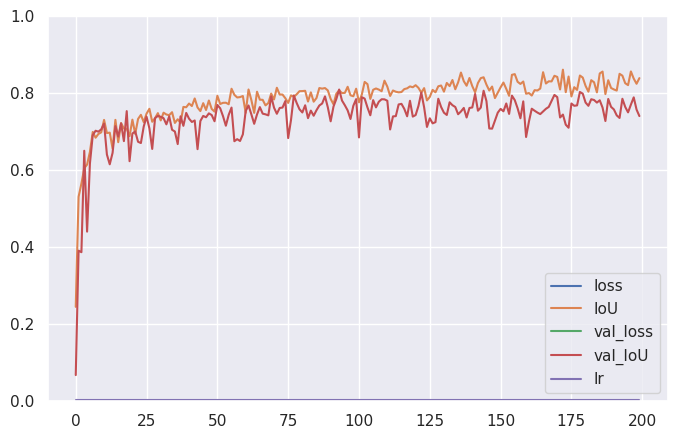

In [42]:
#plotting training values
import seaborn as sns
sns.set()


pd.DataFrame(history1.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

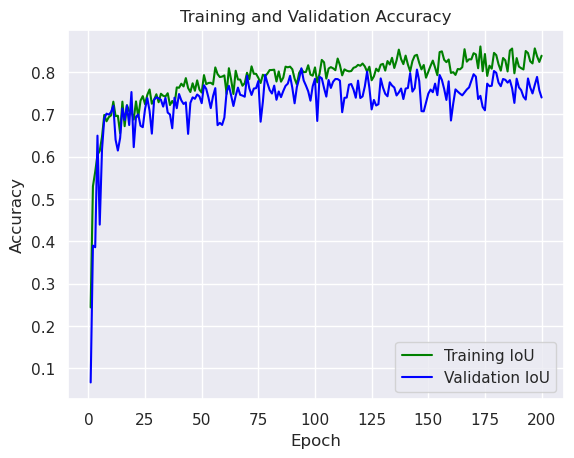

In [43]:
IoU = history1.history['IoU']
val_IoU = history1.history['val_IoU']
epochs = range(1, len(IoU) + 1)

#accuracy plot
plt.plot(epochs, IoU, color='green', label='Training IoU')
plt.plot(epochs, val_IoU, color='blue', label='Validation IoU')
plt.title('Training and Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

1/1 [==============================] - 0s 44ms/step


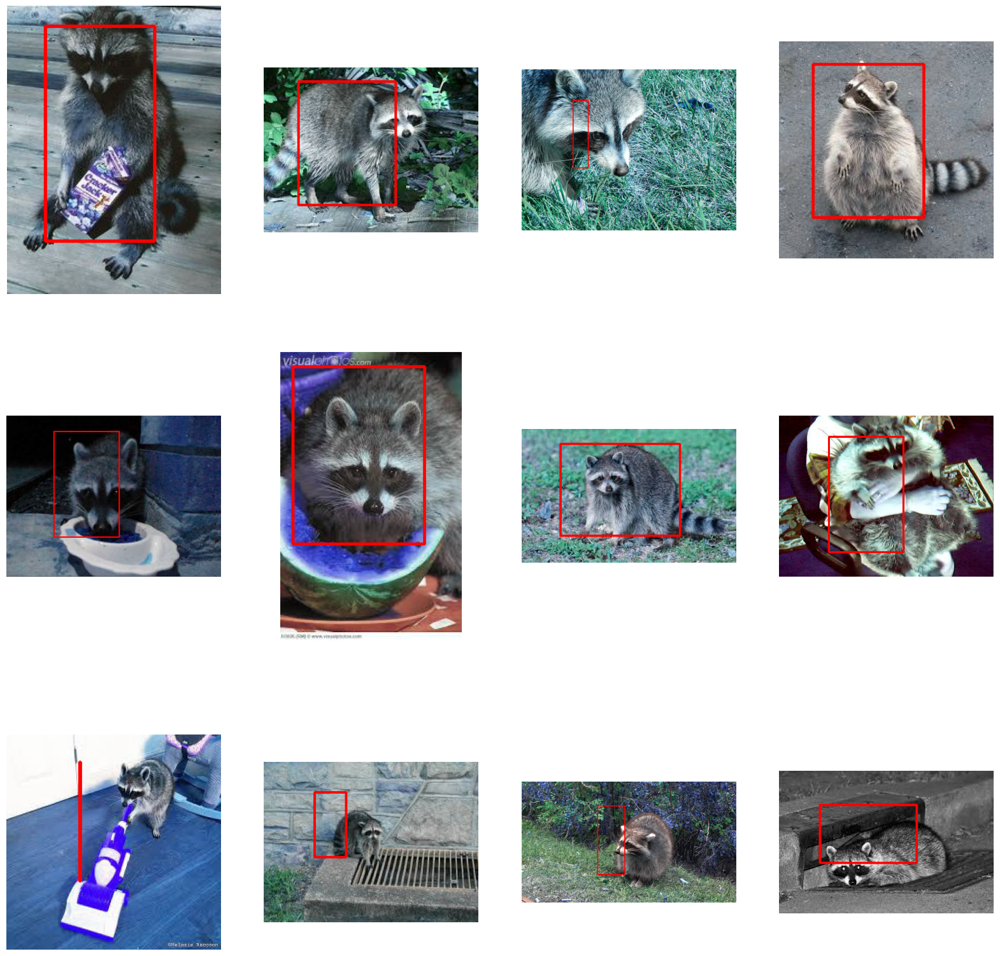

In [44]:
#showing training images with labels
df=pd.read_csv(os.path.join(input_folder,'train_labels_.csv'))[161:]
plt.figure(figsize=(20,20))
for n , i in enumerate(range(12)) : 
    plt.subplot(3,4,n+1)
    
    img = cv2.imread(os.path.join(trainpath,str(df.iloc[i,0])))
    org_img=img.copy()
    
    image_height, image_width, _ = img.shape
    
    
    img = cv2.resize(img,(new_size,new_size))
    img = img / 255.0
    img=np.expand_dims(img,axis=0)
    region = model1.predict(img)[0]
    
    x0 = int(region[0] * image_width / new_size) 
    y0 = int(region[1] * image_height / new_size)
    x1 = int((region[2]) * image_width / new_size)
    y1 = int((region[3]) * image_height / new_size)
    
    cv2.rectangle(org_img,(x0, y0), ((x1 - x0) , (y1 - y0)) , (255,0,0),2)
    plt.imshow(org_img)   
    plt.axis('off')